In [1]:
from keras.optimizers import SGD
import matplotlib.pyplot as plt
from tqdm import tqdm_notebook as tq
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import pickle
from keras.models import load_model
from keras.models import Sequential
from keras.models import Model
from keras.utils.layer_utils import layer_from_config
from keras.layers import *
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from keras.preprocessing.image import load_img,img_to_array
import itertools
import gc
from keras.applications.vgg16 import VGG16
from keras.applications.vgg19 import VGG19
from keras.applications.resnet50 import ResNet50
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
from keras.models import model_from_json
from keras.applications.inception_v3 import InceptionV3
from pipeline_functions import *
from keras.models import model_from_json
from utils import *
import heatmaps_to_rect as htr
import meta

Using Theano backend.
Using gpu device 0: GeForce GTX 960M (CNMeM is enabled with initial size: 80.0% of memory, cuDNN None)


### Given a list of pictures names, we should be able run the entire algorithm on them.

In [2]:
sub_fold = "./Submission/"
mk(sub_fold)
mk(sub_fold + "submission_csv")
mk(sub_fold + "test_data")
mk(sub_fold + "halfway_vectors")
mk(sub_fold + "heatmaps")
mk(sub_fold + "models")

This is what needs to be modified manually

In [6]:
# Precomputing
precompute_network_name = "resnet"
pictures_sizes = [(768, 1216),(1344,2240)]
file_model_precompute = "ResNet_cut.h5"

# Generate heatmaps
file_model_heatmaps = "fish_detection_trained_1.1.h5"
model_heatmaps_name = "simple_first_model"

# Find the boat
boat_classifier_file = ""
treashold = 0.9

# Find rectangles
threshold = 0
ranges=(11,71)
clip = 0.2
border_conf=[(11,3),(71,10)]
batch_size=1
max_fish=2

# Predict
model_predictions = "yoloswagdu113.h5"
#model_predictions_weights = "model_8c_500e_R50_1.h5"

In [7]:
# the format of pictures_meta is (filename, height, width)
pictures_meta = meta.create_metadata_test(sub_fold)
fold_precompute = sub_fold+ "halfway_vectors/" + precompute_network_name + "/"
mk(fold_precompute)
fold_heatmaps = sub_fold + "heatmaps/" + model_heatmaps_name + "/"
mk(fold_heatmaps)
path_model_precompute = sub_fold + "models/" + file_model_precompute
path_model_heatmaps = sub_fold + "models/" + file_model_heatmaps
path_model_predictions = sub_fold + "models/" + model_predictions
#path_weights_predictions = sub_fold + "models/" + model_predictions_weights

In [8]:
pictures_meta[0]

('./Submission/test_data/img_00005.jpg', 'img_00005.jpg', 720, 1280)

### We generate mid-network vectors:

In [9]:
generate_intermediary_vectors(pictures_meta, pictures_sizes, fold_precompute, path_model_precompute)

OSError: Unable to open file (Unable to open file: name = './submission/models/resnet_cut.h5', errno = 2, error message = 'no such file or directory', flags = 0, o_flags = 0)

### We compute the heatmaps:

In [6]:
heatmaps = create_heatmaps(pictures_meta, fold_precompute, pictures_sizes, path_model_heatmaps, fold_heatmaps)

In [7]:
heatmaps.shape

(1000, 5, 36, 64)

1.19246077538


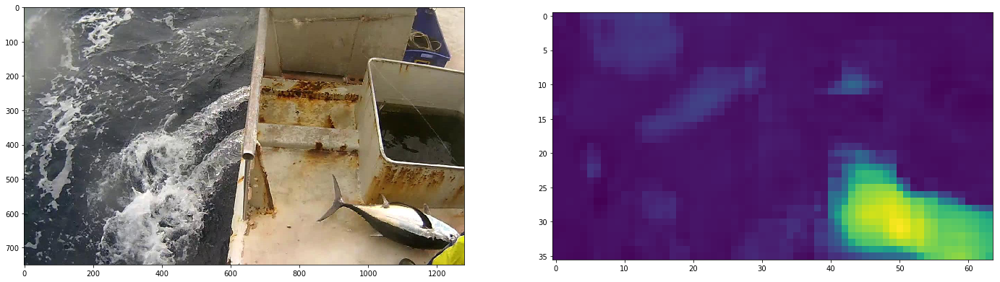

0.609962165356


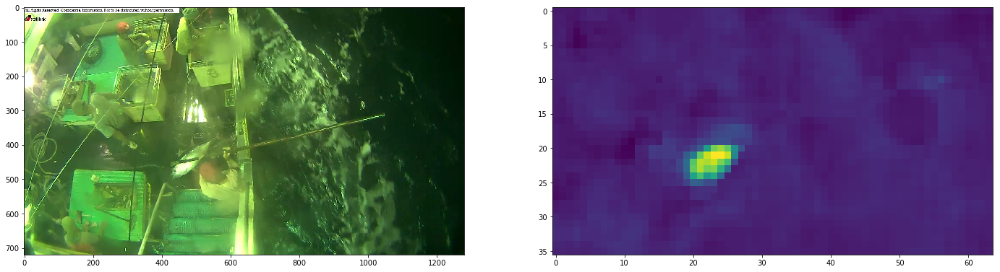

0.376914829016


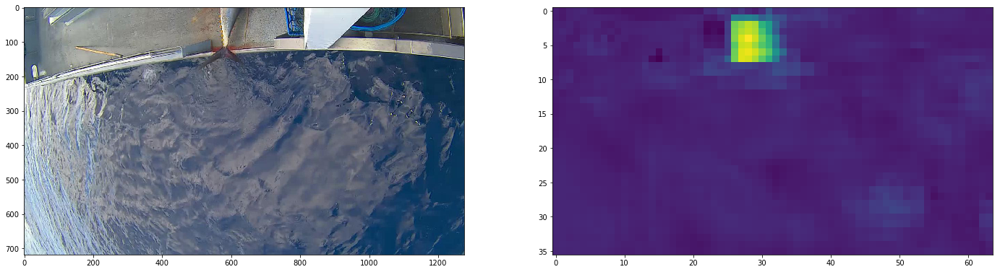

1.10709786415


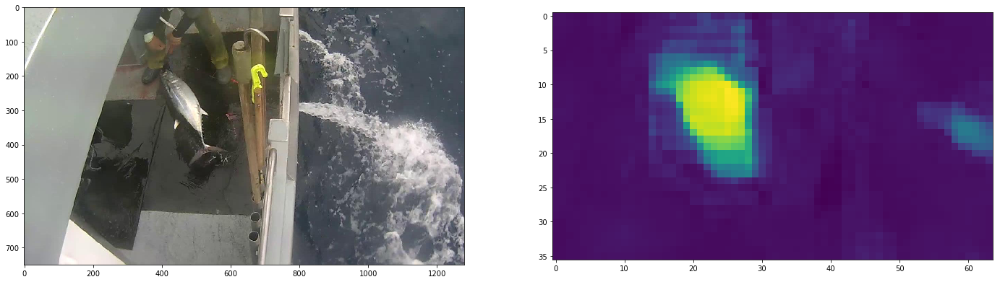

1.12989675999


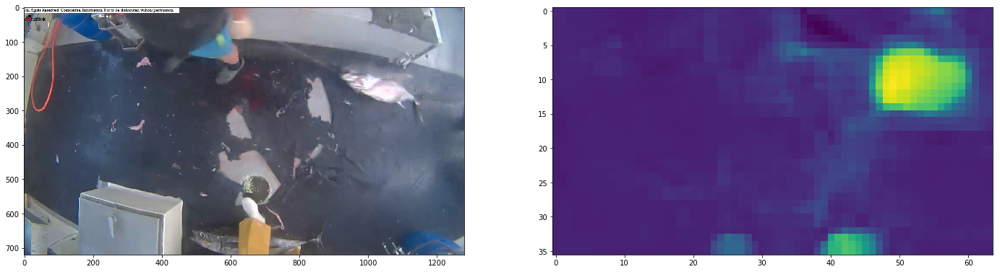

1.15432345867


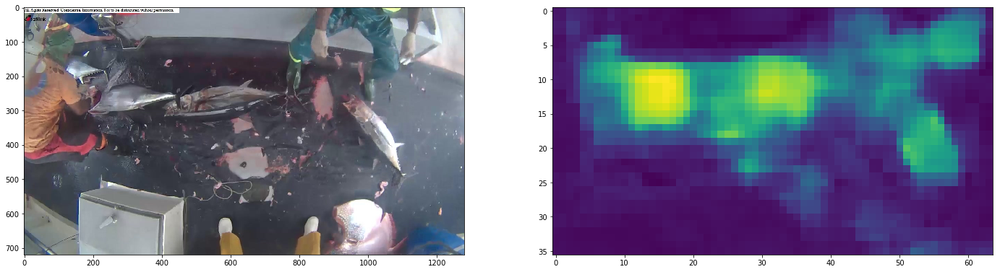

0.618353426456


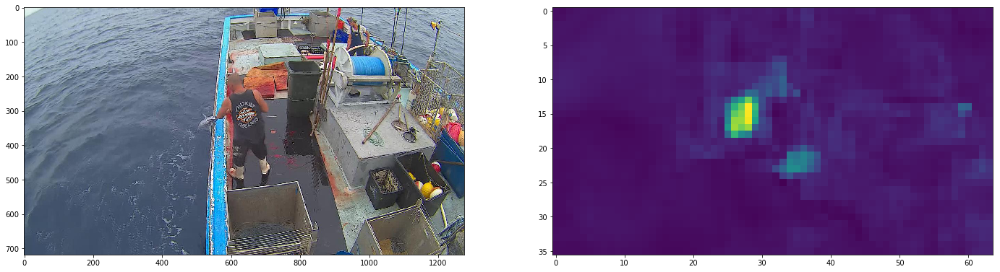

0.942487597466


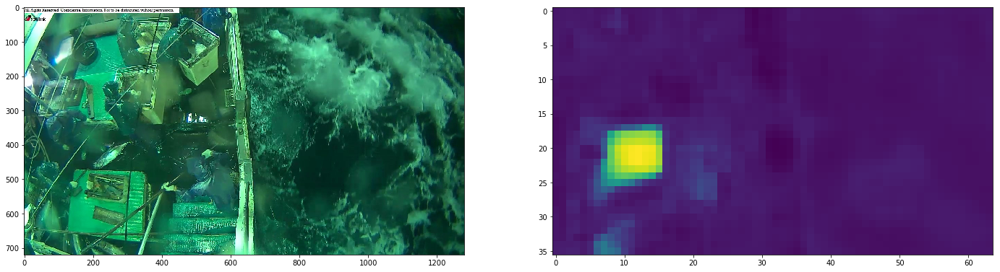

0.973224580288


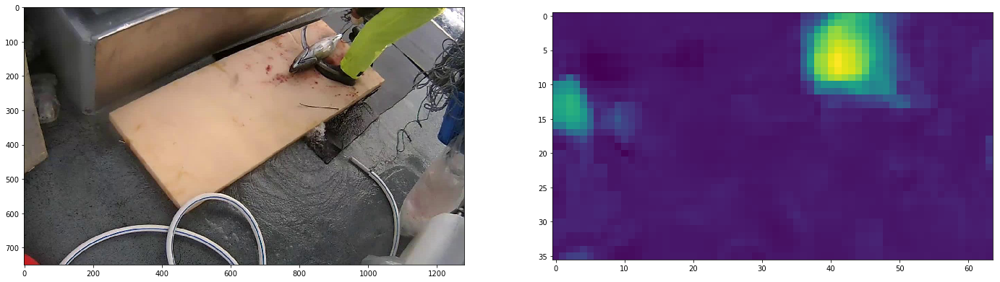

1.04335725307


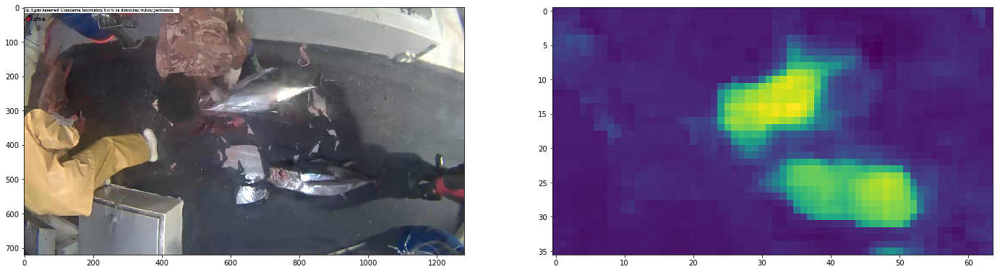

0.552712619305


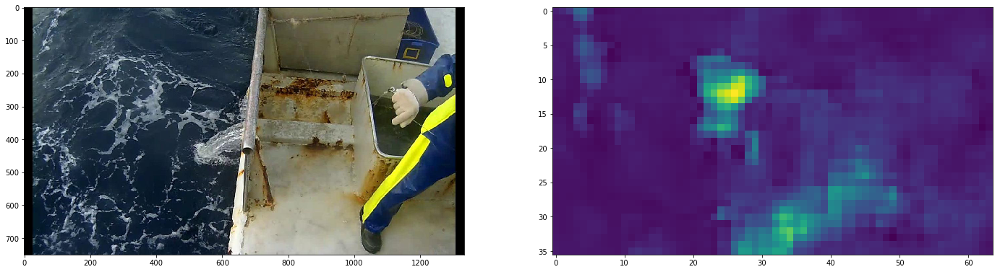

0.781539976597


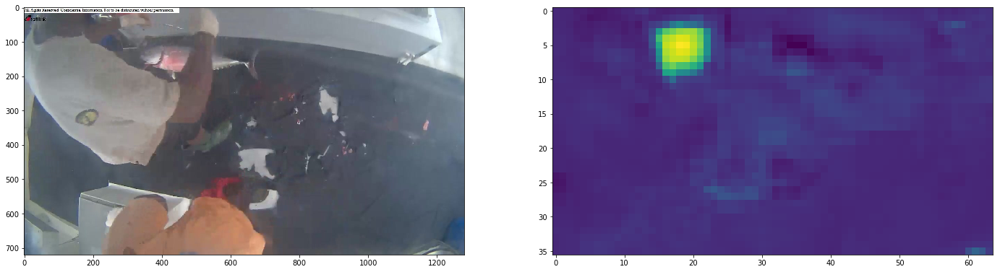

0.714872658253


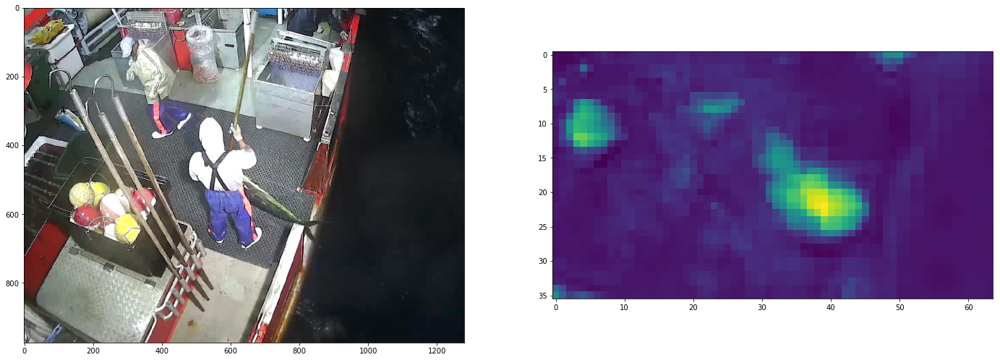

0.782779633999


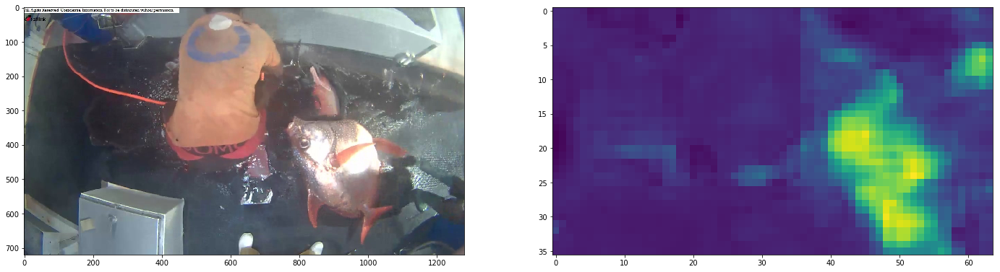

0.481872528791


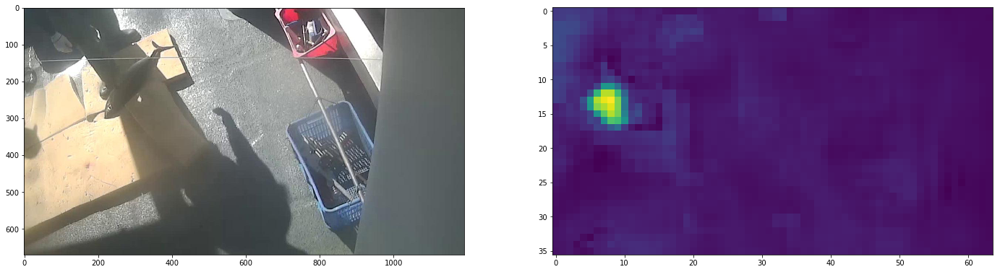

1.14083147049


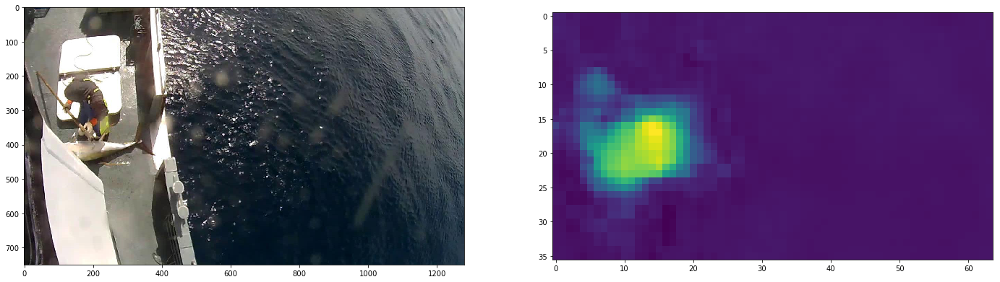

1.09269928932


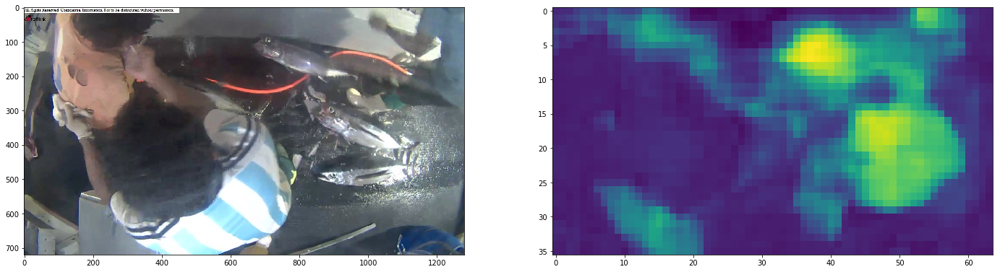

0.42559158802


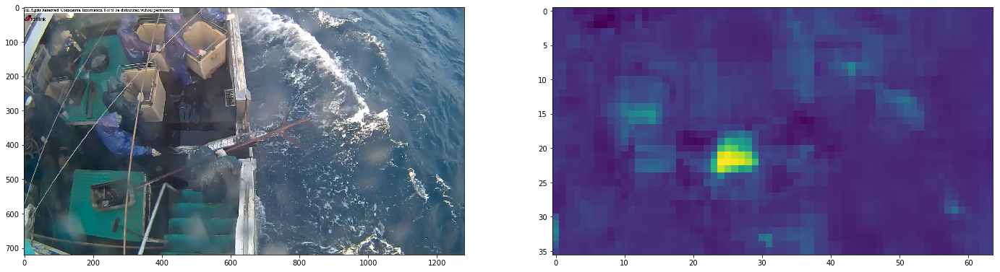

0.627473771572


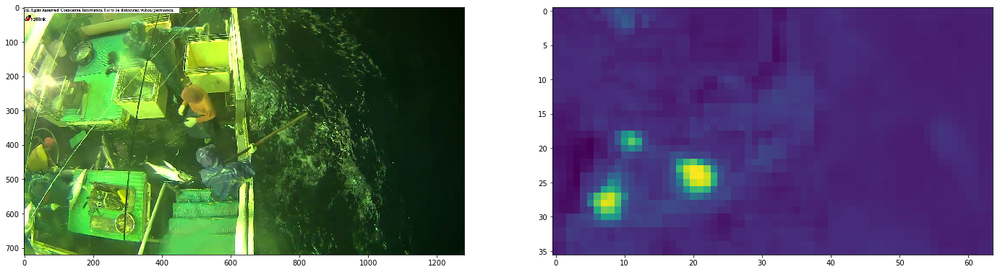

0.957514584064


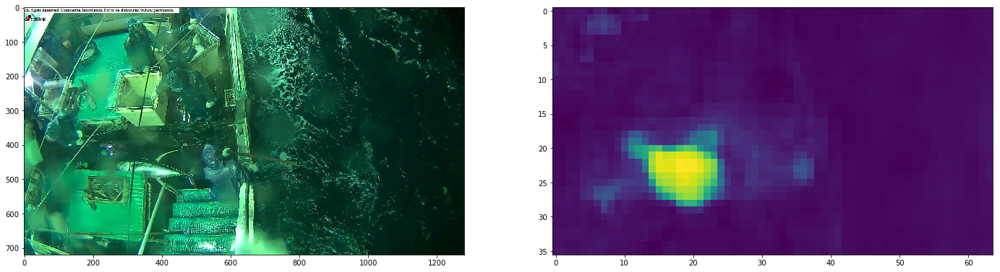

In [8]:
show_heatmaps(heatmaps, pictures_meta, 200, mask_idx=0, nb_to_show = 20)

In [7]:
heatmaps_png(heatmaps,pictures_meta,"Submission/png/")

KeyboardInterrupt: 

### We find the boats:

### We find the rectangles:

In [12]:
rectangles, scores = htr.find_rectangles(heatmaps, threshold, ranges, clip, border_conf=border_conf,
                                     batch_size=batch_size, max_fish=max_fish, scores=True)

DEBUG: nvcc STDOUT mod.cu
   Creating library C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpyfucza5l/m9a6bd0eb5ed5c92e91261282fc495cb4.lib and object C:/Users/yolo/AppData/Local/Theano/compiledir_Windows-10-10.0.14393-SP0-Intel64_Family_6_Model_60_Stepping_3_GenuineIntel-3.5.2-64/tmpyfucza5l/m9a6bd0eb5ed5c92e91261282fc495cb4.exp



In [13]:
new_rectangles = resize_rectangles(rectangles, pictures_meta, heatmaps.shape[-1], heatmaps.shape[-2])

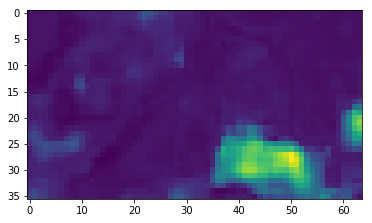

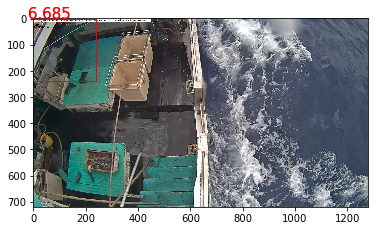

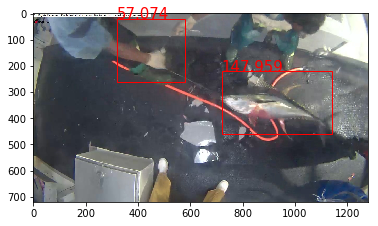

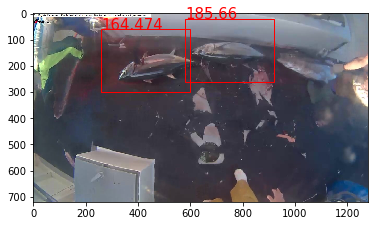

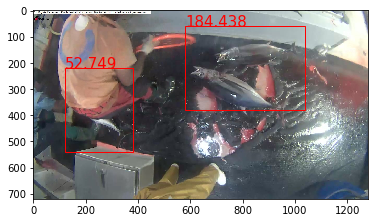

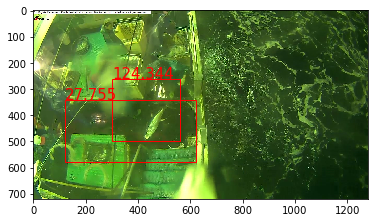

In [14]:
print_rectangles(new_rectangles, scores,pictures_meta, 0, nb_to_show = 5)

In [18]:
def save_rectangles_png(new_rectangles, scores, pictures_meta, folder):
    mk(folder)
    for i in range(0,1000):
        fig,ax = plt.subplots(1)
        ax.imshow(np.array(Image.open(pictures_meta[i][0]), dtype=np.uint8))
        
        for rec, score in zip(new_rectangles[i], scores[i]):
            
            ax.text(rec[1],rec[0], str(round(score,3)), fontsize=15, color = "r")
            rect = patches.Rectangle((rec[1],rec[0]),rec[3],rec[2],
                                linewidth=1,edgecolor='r',facecolor='none')
            ax.add_patch(rect)
            
        plt.savefig(folder + pictures_meta[i][1], dpi=1000)

In [19]:
save_rectangles_png(new_rectangles, scores, pictures_meta, "Submission/rect_png/")

C:\Program Files\Anaconda3\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


KeyboardInterrupt: 

### We crop the images:

In [59]:
def crop_images(pictures_meta, new_rectangles):
    cropped = []
    
    for rects, (path, f_name, height, width) in tq(zip(new_rectangles,pictures_meta)):
        img_crops = []
        img = Image.open(path)
        for rect in rects:
            crop = img.crop((rect[1],rect[0] ,rect[1] + rect[3], rect[0]+ rect[2]))
            img_crops.append(crop)
        cropped.append(img_crops)
    return cropped

In [60]:
cropped = crop_images(pictures_meta, new_rectangles)

### We apply the classifier:

In [61]:
def species_classifier(cropped, path_model_predictions):
    """with open(path_model_predictions, 'r') as myfile:
        json_string = myfile.read()
    model = model_from_json(json_string)
    for layer in model.layers[:102]:
        layer.trainable=False
    model.load_weights(weights_path)"""
    
    model = load_model(path_model_predictions)
    p_species = []
    
    for img in tq(cropped):
        p_species_img = []
        for cropped_img in img:
            cropped_img = cropped_img.resize((256,256))
            array = img_to_array(cropped_img)
            array = np.expand_dims(array,0)
            results = model.predict(array)[0]
            p_species_img.append(results)
        p_species.append(p_species_img)
        
    return p_species
    

In [62]:
p_species = species_classifier(cropped, path_model_predictions)

In [63]:
p_species[0]

[array([  2.67301537e-02,   2.12815765e-04,   5.29392797e-04,
          6.14126446e-04,   9.63569224e-01,   3.16142174e-03,
          1.87458098e-03,   3.30840936e-03], dtype=float32)]

### We average the results:

In [72]:
def combine_probabilities(predictions,scores,opt='sum'):
    result = np.zeros((1000,1,8))
    for i in range(1000):
        for j in range(1):
            result[i,j] = np.array(predictions[i][j])*scores[i][j]
    if opt=='sum':  
        #print(np.sum(result.mean(axis=1)/result.mean(axis=1).sum()))
        a = result.mean(axis=1)
        for i in range(1000):
            a[i] = a[i]/np.sum(a[i])
        if a.sum() != 1000:
            print('ERROR')
            return None
        else:
            return a
    if opt=='mul':
        result_f = np.zeros((1000,8))
        for i in range(1000):
            result_f[i] = np.multiply(result[i,0],result[i,1])/np.sum(np.multiply(result[i,0],result[i,1]))
        #print(np.sum(result_f/result_f.sum()))
        a = result_f
        if a.sum() != 1000:
            print('ERROR')
            return None
        else:
            return result_f
           

In [73]:
p_species_array=np.array(p_species)
scores_array = np.array(scores)

In [74]:
final_predictions = combine_probabilities(p_species_array, scores_array,opt='sum')

In [75]:
np.sum(final_predictions[1])

1.0

### Creating the csv:

In [76]:
def create_submission(predictions, info):
    import pandas as pd
    import datetime
    
    
    # WE NEED TO CHANGE THIS PART BECAUSE THE CODES FOR THE CLASSES HAS CHANGED 
    
    
    
    #result1 = pd.DataFrame(predictions, columns=['ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT','image'])
    result1 = pd.DataFrame(predictions, columns=['image','ALB', 'BET', 'DOL', 'LAG', 'NoF', 'OTHER', 'SHARK', 'YFT'])
    #result1.loc['image',:] = pd.Series(test_id, index=result1.index)
    now = datetime.datetime.now()
    sub_file = 'submission_' + info + '_' + str(now.strftime("%Y-%m-%d-%H-%M")) + '.csv'
    result1.to_csv(sub_file, index=False)
    print('done',sub_file)


def to_csv(final_predictions, pictures_meta):
    imgs_name = [x[1] for x in pictures_meta]
    output = []
    for prediction,img_name in zip(final_predictions.tolist(),imgs_name):
        output.append(np.hstack((np.array(img_name),prediction)))
    create_submission(output,'') 

In [77]:
to_csv(final_predictions, pictures_meta) #Must print the submission number

done submission__2017-01-21-02-37.csv
